In [1]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(42)

N = 500
EPOCHS = 200
LR = 0.01

# Architectures to try
# Dataset 1: one hidden layer
ARCH1 = [(4,), (8,), (16,), (32,)]

# Dataset 2: two hidden layers
ARCH2 = [(8,8), (16,16), (32,16), (32,32)]

print("Setup complete")

Setup complete


Dataset 1 shape: (1500, 2)
Number of samples: 1500


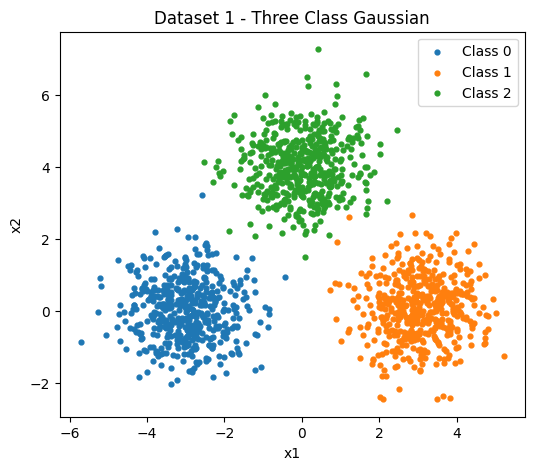

In [2]:
def generate_gaussian():

    X1 = np.random.multivariate_normal(
        [-3, 0],
        [[0.7, 0], [0, 0.7]],
        N
    )

    X2 = np.random.multivariate_normal(
        [3, 0],
        [[0.7, 0], [0, 0.7]],
        N
    )

    X3 = np.random.multivariate_normal(
        [0, 4],
        [[0.7, 0], [0, 0.7]],
        N
    )

    X = np.vstack((X1, X2, X3))
    y = np.repeat([0, 1, 2], N)

    return X, y


X1, y1 = generate_gaussian()

print("Dataset 1 shape:", X1.shape)
print("Number of samples:", len(X1))

plt.figure(figsize=(6,5))

for c in range(3):
    p = y1 == c
    plt.scatter(X1[p,0], X1[p,1], s=12, label=f"Class {c}")

plt.xlabel("x1")
plt.ylabel("x2")
plt.title("Dataset 1 - Three Class Gaussian")
plt.legend()
plt.show()

Dataset 2 shape: (1500, 2)
Number of samples: 1500


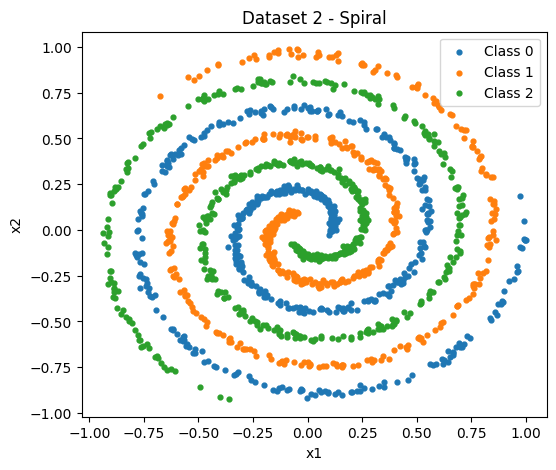

In [3]:
def generate_spiral():

    X = []
    y = []

    for c in range(3):

        theta = np.linspace(0, 4*np.pi, N)
        radius = np.linspace(0.1, 1.0, N)

        noise = np.random.normal(0, 0.15, N)

        angle = theta + c*(2*np.pi/3) + noise

        x1 = radius * np.cos(angle)
        x2 = radius * np.sin(angle)

        points = np.column_stack((x1, x2))

        X.append(points)
        y += [c] * N

    return np.vstack(X), np.array(y)


X2, y2 = generate_spiral()

print("Dataset 2 shape:", X2.shape)
print("Number of samples:", len(X2))

plt.figure(figsize=(6,5))

for c in range(3):
    p = y2 == c
    plt.scatter(X2[p,0], X2[p,1], s=12, label=f"Class {c}")

plt.xlabel("x1")
plt.ylabel("x2")
plt.title("Dataset 2 - Spiral")
plt.legend()
plt.show()

In [4]:
def split_data(X, y):

    train_X, val_X, test_X = [], [], []
    train_y, val_y, test_y = [], [], []

    for c in range(3):

        indices = np.where(y == c)[0]
        np.random.shuffle(indices)

        n_train = int(0.60 * len(indices))
        n_val = int(0.20 * len(indices))

        train_idx = indices[:n_train]
        val_idx = indices[n_train:n_train+n_val]
        test_idx = indices[n_train+n_val:]

        train_X.append(X[train_idx])
        val_X.append(X[val_idx])
        test_X.append(X[test_idx])

        train_y.extend([c] * len(train_idx))
        val_y.extend([c] * len(val_idx))
        test_y.extend([c] * len(test_idx))

    return (
        np.vstack(train_X), np.array(train_y),
        np.vstack(val_X), np.array(val_y),
        np.vstack(test_X), np.array(test_y)
    )


def standardize(train_X, val_X, test_X):

    mean = train_X.mean(axis=0)
    std = train_X.std(axis=0)

    train_X = (train_X - mean) / std
    val_X = (val_X - mean) / std
    test_X = (test_X - mean) / std

    return train_X, val_X, test_X

In [5]:
def one_hot(y):

    result = np.zeros((len(y), 3))
    result[np.arange(len(y)), y] = 1

    return result


class FCNN:

    def __init__(self, hidden_layers):

        layers = [2] + list(hidden_layers) + [3]

        self.W = []
        self.b = []

        for i in range(len(layers)-1):

            w = np.random.randn(
                layers[i],
                layers[i+1]
            ) * np.sqrt(2/layers[i])

            b = np.zeros(layers[i+1])

            self.W.append(w)
            self.b.append(b)


    # ---------------- FORWARD PROPAGATION ----------------

    def forward(self, x):

        A = [x]
        Z = []

        a = x

        # Hidden layers
        for i in range(len(self.W)-1):

            z = a @ self.W[i] + self.b[i]

            a = np.tanh(z)

            Z.append(z)
            A.append(a)

        # Output layer
        z = a @ self.W[-1] + self.b[-1]

        Z.append(z)
        A.append(z)

        return A, Z


    # ---------------- PREDICTION ----------------

    def predict(self, X):

        predictions = []

        for x in X:

            A, Z = self.forward(x)

            output = A[-1]

            predictions.append(np.argmax(output))

        return np.array(predictions)


    # ---------------- ACCURACY ----------------

    def accuracy(self, X, y):

        prediction = self.predict(X)

        return np.mean(prediction == y)


    # ---------------- SGD + BACKPROPAGATION ----------------

    def train(self, X, y):

        Y = one_hot(y)

        error_history = []

        for epoch in range(EPOCHS):

            indices = np.random.permutation(len(X))

            total_error = 0

            for index in indices:

                x = X[index]
                target = Y[index]

                # Forward pass
                A, Z = self.forward(x)

                output = A[-1]

                # Squared error
                error = 0.5 * np.sum(
                    (output - target)**2
                )

                total_error += error

                # Backpropagation
                delta = [None] * len(self.W)

                # Output layer
                delta[-1] = output - target

                # Hidden layers
                for i in range(len(self.W)-2, -1, -1):

                    delta[i] = (
                        self.W[i+1] @ delta[i+1]
                    ) * (
                        1 - np.tanh(Z[i])**2
                    )

                # SGD weight update
                for i in range(len(self.W)):

                    self.W[i] -= LR * np.outer(
                        A[i],
                        delta[i]
                    )

                    self.b[i] -= LR * delta[i]

            error_history.append(
                total_error / len(X)
            )

        return error_history

In [6]:
def cross_validation(X, y, architecture):

    indices = np.random.permutation(len(X))
    folds = np.array_split(indices, 3)

    scores = []

    for i in range(3):

        val_idx = folds[i]

        train_idx = np.concatenate([
            folds[j]
            for j in range(3)
            if j != i
        ])

        model = FCNN(architecture)

        model.train(
            X[train_idx],
            y[train_idx]
        )

        acc = model.accuracy(
            X[val_idx],
            y[val_idx]
        )

        scores.append(acc)

        print(
            "Fold", i+1,
            "Accuracy =",
            round(acc*100, 2), "%"
        )

    return np.mean(scores)

In [7]:
def confusion_matrix(y_true, y_pred):

    matrix = np.zeros((3,3), dtype=int)

    for actual, predicted in zip(y_true, y_pred):

        matrix[actual][predicted] += 1

    return matrix

In [8]:
def decision_region(model, X, y, title):

    x_min = X[:,0].min() - 0.5
    x_max = X[:,0].max() + 0.5

    y_min = X[:,1].min() - 0.5
    y_max = X[:,1].max() + 0.5

    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, 200),
        np.linspace(y_min, y_max, 200)
    )

    grid = np.c_[xx.ravel(), yy.ravel()]

    predictions = model.predict(grid)

    predictions = predictions.reshape(xx.shape)

    plt.figure(figsize=(6,5))

    plt.contourf(
        xx,
        yy,
        predictions,
        alpha=0.25
    )

    for c in range(3):

        p = y == c

        plt.scatter(
            X[p,0],
            X[p,1],
            s=12,
            label=f"Class {c}"
        )

    plt.xlabel("x1")
    plt.ylabel("x2")
    plt.title(title)
    plt.legend()

    plt.show()

In [9]:
def plot_error(error_history, title):

    plt.figure(figsize=(6,4))

    plt.plot(
        range(1, len(error_history)+1),
        error_history
    )

    plt.xlabel("Epoch")
    plt.ylabel("Average squared error")
    plt.title(title)

    plt.grid()
    plt.show()

In [10]:
def plot_node_outputs(model, X, title):

    hidden_outputs = []
    output_outputs = []

    for x in X:

        A, Z = model.forward(x)

        hidden_outputs.append(A[-2])
        output_outputs.append(A[-1])

    hidden_outputs = np.array(hidden_outputs)
    output_outputs = np.array(output_outputs)

    # Hidden nodes
    for j in range(hidden_outputs.shape[1]):

        fig = plt.figure(figsize=(6,5))
        ax = fig.add_subplot(111, projection='3d')

        ax.scatter(
            X[:,0],
            X[:,1],
            hidden_outputs[:,j],
            s=8
        )

        ax.set_xlabel("Input x1")
        ax.set_ylabel("Input x2")
        ax.set_zlabel("Hidden node output")

        ax.set_title(
            title + f" - Hidden Node {j+1}"
        )

        plt.show()

    # Output nodes
    for j in range(3):

        fig = plt.figure(figsize=(6,5))
        ax = fig.add_subplot(111, projection='3d')

        ax.scatter(
            X[:,0],
            X[:,1],
            output_outputs[:,j],
            s=8
        )

        ax.set_xlabel("Input x1")
        ax.set_ylabel("Input x2")
        ax.set_zlabel("Output node output")

        ax.set_title(
            title + f" - Output Node {j+1}"
        )

        plt.show()

Training samples: 900
Validation samples: 300
Test samples: 300

Architecture: (4,)
Fold 1 Accuracy = 99.33 %
Fold 2 Accuracy = 99.0 %
Fold 3 Accuracy = 99.67 %
Average CV accuracy: 99.33 %

Architecture: (8,)
Fold 1 Accuracy = 99.67 %
Fold 2 Accuracy = 99.33 %
Fold 3 Accuracy = 99.0 %
Average CV accuracy: 99.33 %

Architecture: (16,)
Fold 1 Accuracy = 99.67 %
Fold 2 Accuracy = 99.33 %
Fold 3 Accuracy = 99.67 %
Average CV accuracy: 99.56 %

Architecture: (32,)
Fold 1 Accuracy = 99.0 %
Fold 2 Accuracy = 100.0 %
Fold 3 Accuracy = 99.33 %
Average CV accuracy: 99.44 %

Best Dataset 1 architecture: (16,)

Training accuracy: 99.56 %
Validation accuracy: 100.0 %
Test accuracy: 100.0 %

Validation Confusion Matrix:
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]

Test Confusion Matrix:
[[100   0   0]
 [  0 100   0]
 [  0   0 100]]


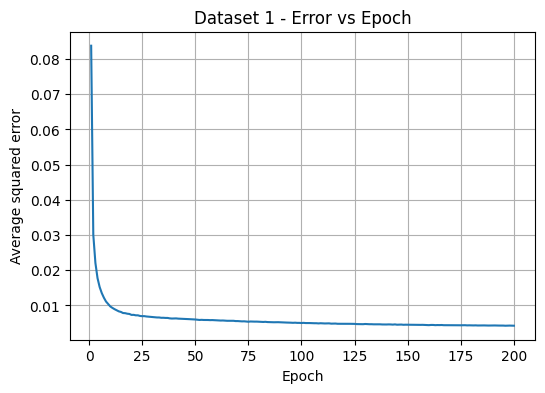

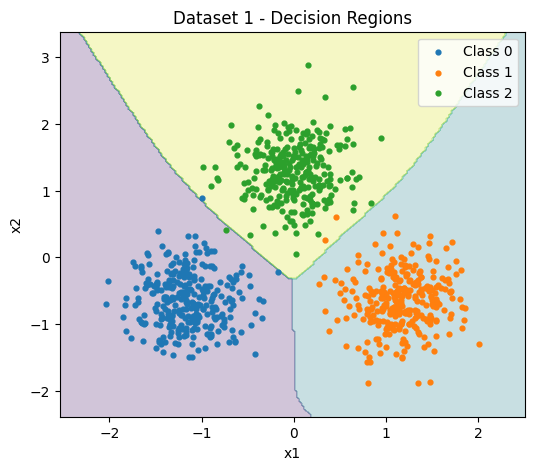

In [11]:
# =====================================================
# DATASET 1
# =====================================================

trX1, trY1, vaX1, vaY1, teX1, teY1 = split_data(X1, y1)

trX1, vaX1, teX1 = standardize(
    trX1,
    vaX1,
    teX1
)

print("Training samples:", len(trX1))
print("Validation samples:", len(vaX1))
print("Test samples:", len(teX1))


# =====================================================
# CROSS VALIDATION
# =====================================================

scores1 = {}

for arch in ARCH1:

    print("\nArchitecture:", arch)

    score = cross_validation(
        trX1,
        trY1,
        arch
    )

    scores1[arch] = score

    print(
        "Average CV accuracy:",
        round(score*100,2),
        "%"
    )


best_arch1 = max(
    scores1,
    key=scores1.get
)

print("\nBest Dataset 1 architecture:", best_arch1)


# =====================================================
# FINAL TRAINING
# =====================================================

model1 = FCNN(best_arch1)

error1 = model1.train(
    trX1,
    trY1
)


# =====================================================
# ACCURACY
# =====================================================

print("\nTraining accuracy:",
      round(model1.accuracy(trX1,trY1)*100,2), "%")

print("Validation accuracy:",
      round(model1.accuracy(vaX1,vaY1)*100,2), "%")

print("Test accuracy:",
      round(model1.accuracy(teX1,teY1)*100,2), "%")


# =====================================================
# CONFUSION MATRICES
# =====================================================

pred_val1 = model1.predict(vaX1)
pred_test1 = model1.predict(teX1)

print("\nValidation Confusion Matrix:")
print(confusion_matrix(vaY1,pred_val1))

print("\nTest Confusion Matrix:")
print(confusion_matrix(teY1,pred_test1))


# =====================================================
# ERROR PLOT
# =====================================================

plot_error(
    error1,
    "Dataset 1 - Error vs Epoch"
)


# =====================================================
# DECISION REGION
# =====================================================

decision_region(
    model1,
    trX1,
    trY1,
    "Dataset 1 - Decision Regions"
)

DATASET 1 - TRAINING NODE OUTPUTS


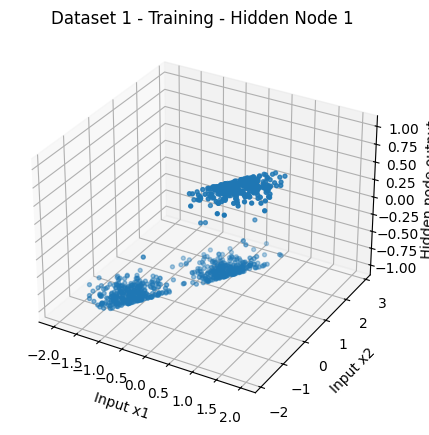

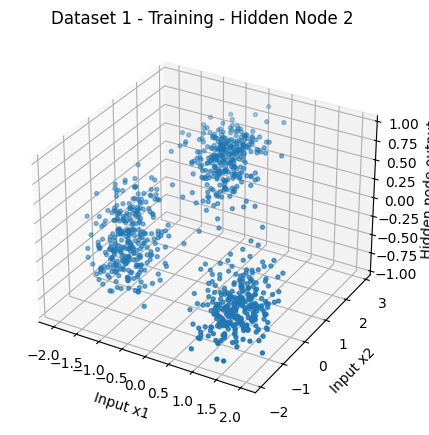

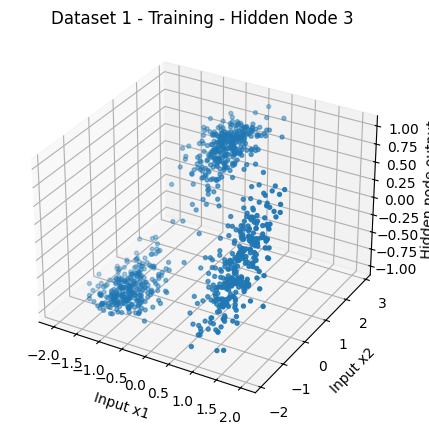

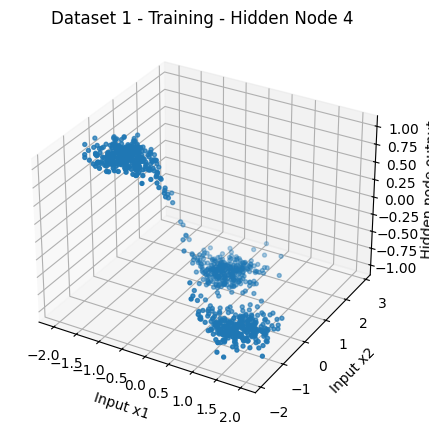

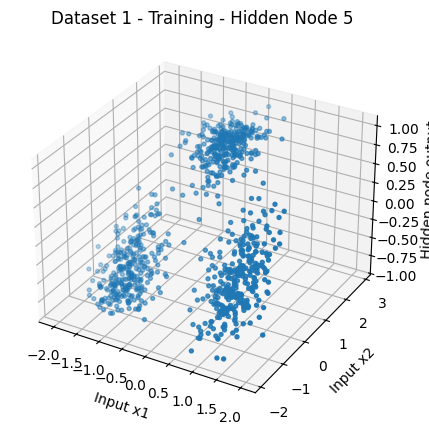

...

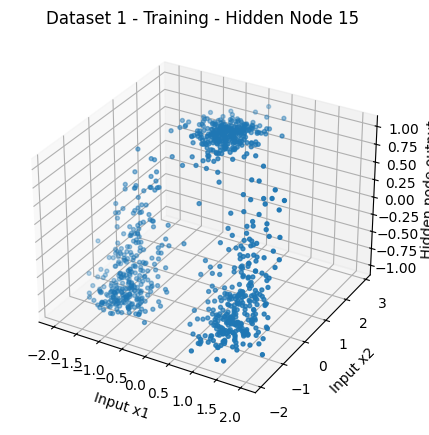

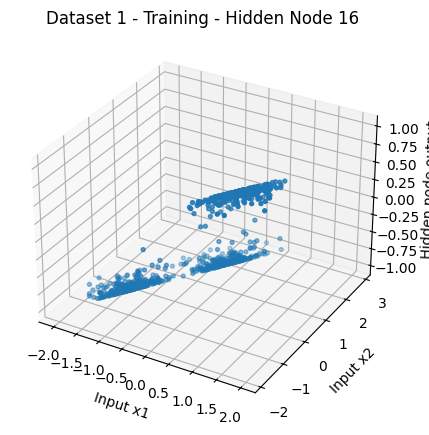

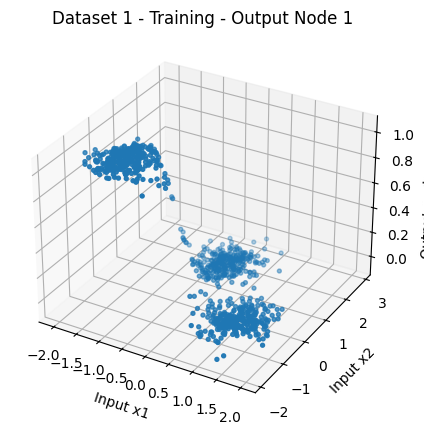

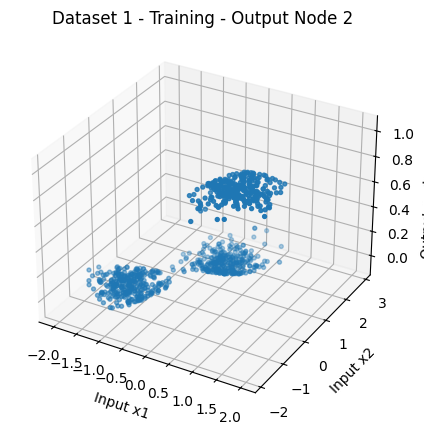

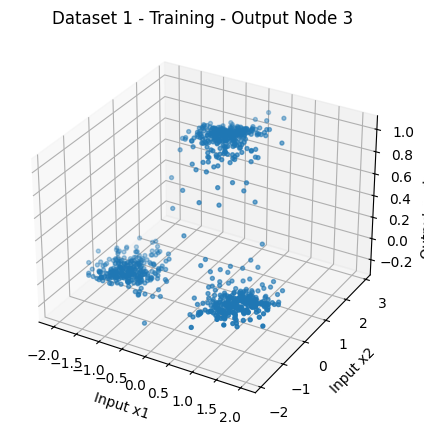

DATASET 1 - VALIDATION NODE OUTPUTS


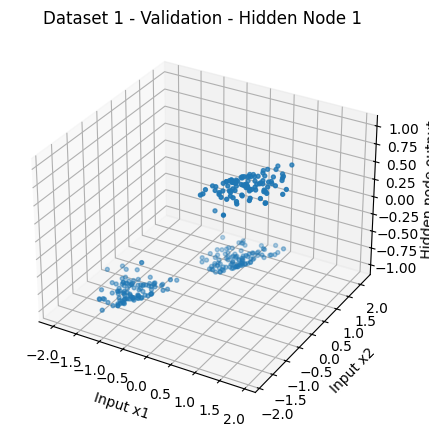

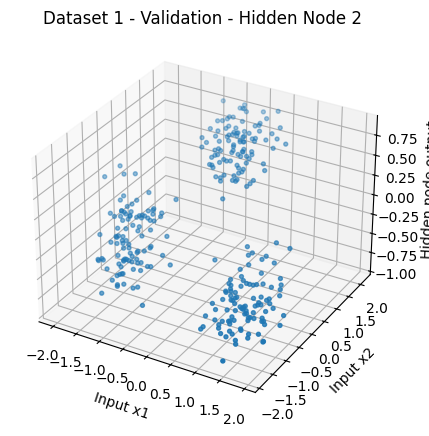

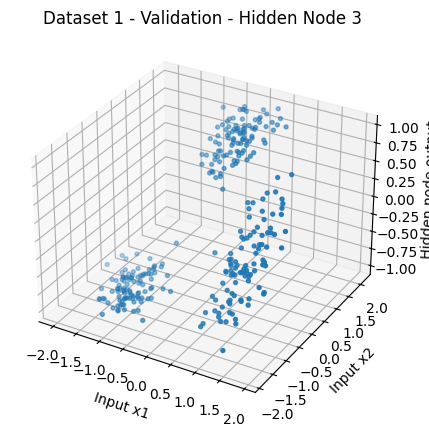

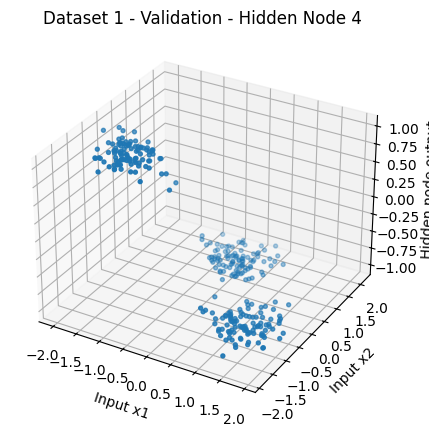

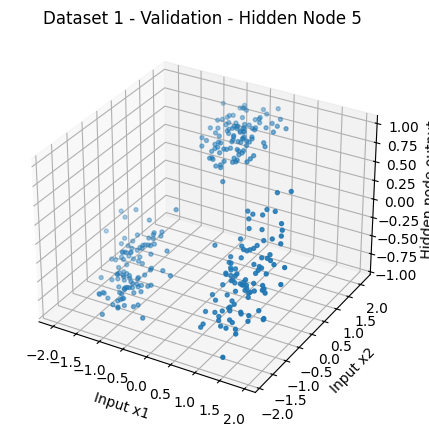

...

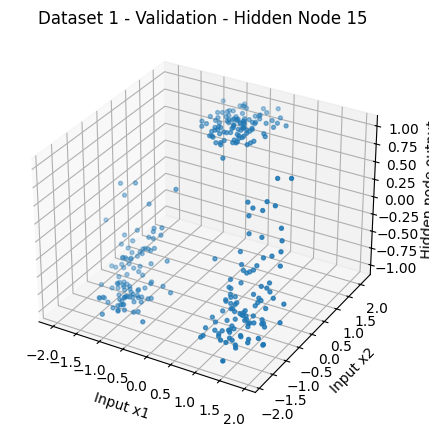

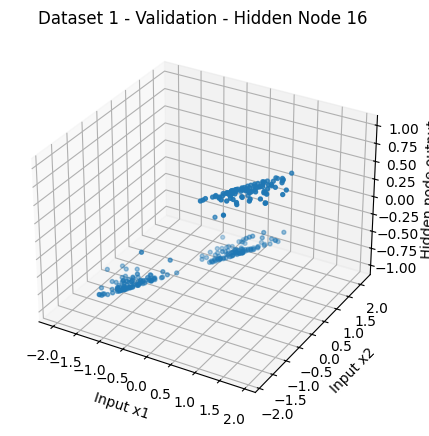

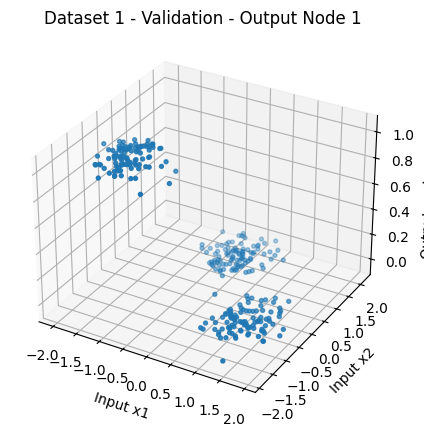

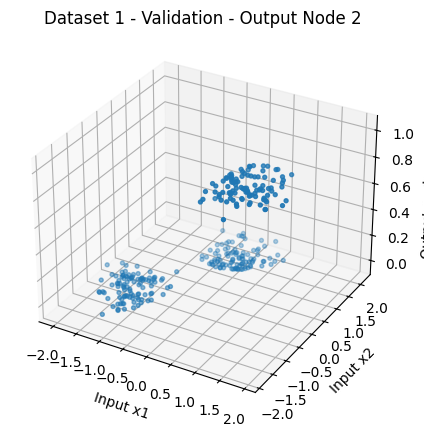

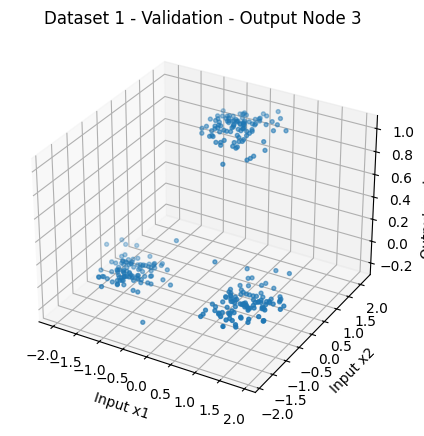

DATASET 1 - TEST NODE OUTPUTS


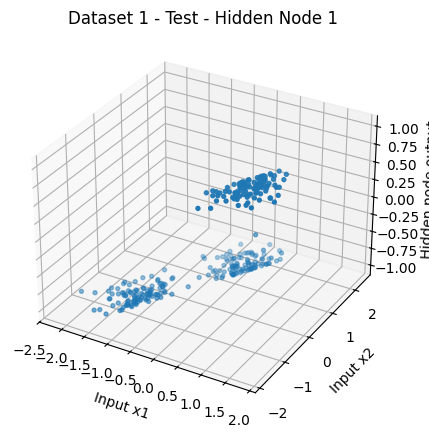

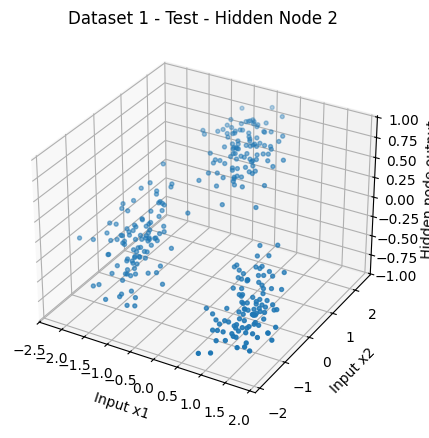

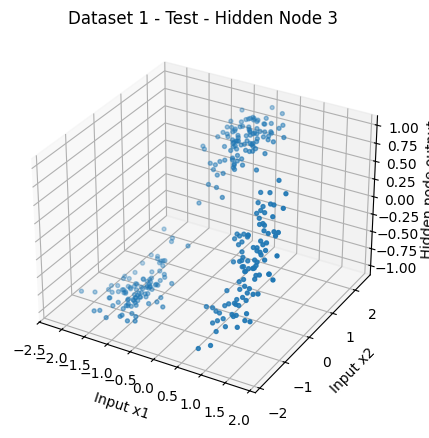

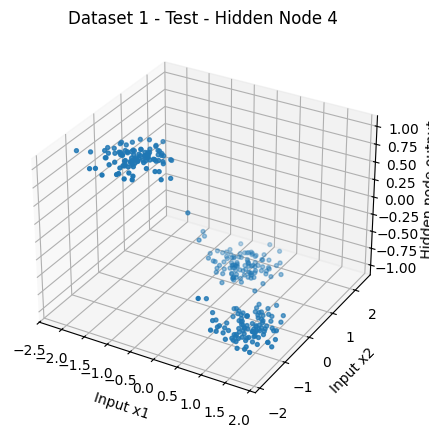

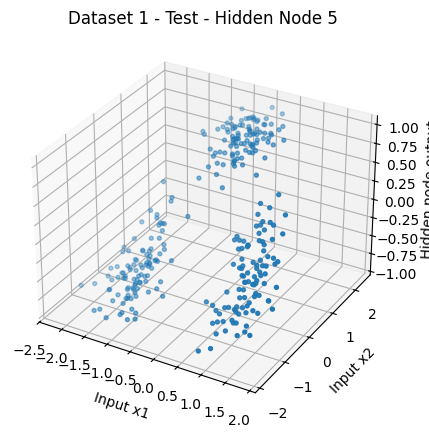

...

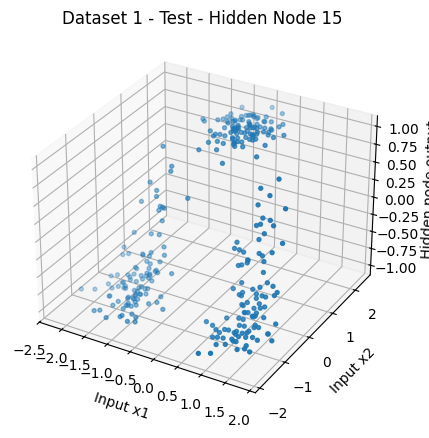

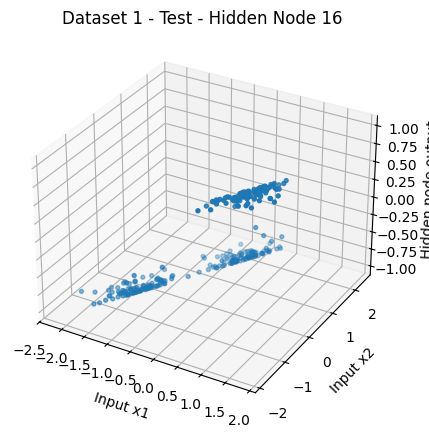

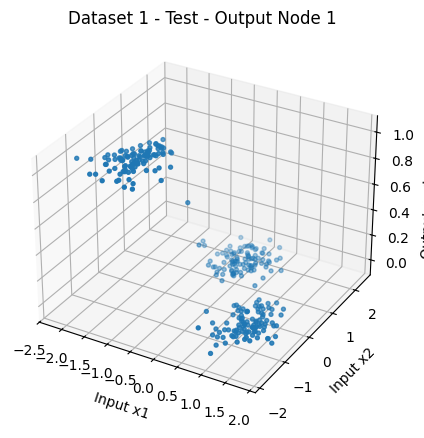

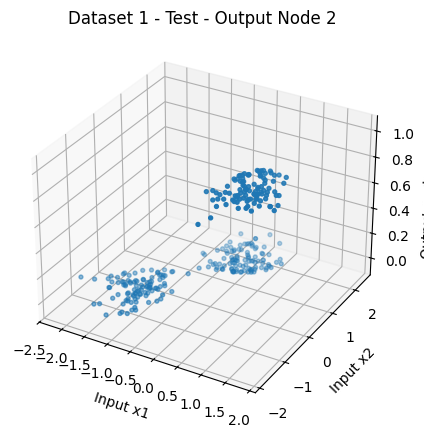

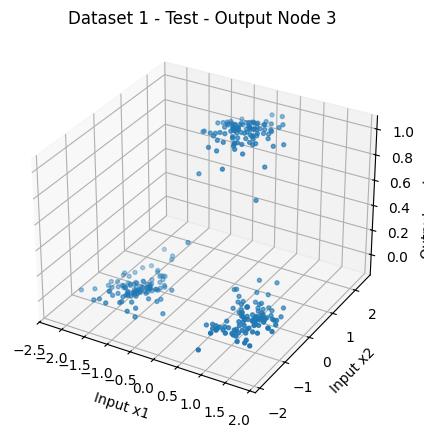

In [12]:
print("DATASET 1 - TRAINING NODE OUTPUTS")

plot_node_outputs(
    model1,
    trX1,
    "Dataset 1 - Training"
)


print("DATASET 1 - VALIDATION NODE OUTPUTS")

plot_node_outputs(
    model1,
    vaX1,
    "Dataset 1 - Validation"
)


print("DATASET 1 - TEST NODE OUTPUTS")

plot_node_outputs(
    model1,
    teX1,
    "Dataset 1 - Test"
)

Training samples: 900
Validation samples: 300
Test samples: 300

Architecture: (8, 8)
Fold 1 Accuracy = 48.67 %
Fold 2 Accuracy = 39.33 %
Fold 3 Accuracy = 50.0 %
Average CV accuracy: 46.0 %

Architecture: (16, 16)
Fold 1 Accuracy = 53.33 %
Fold 2 Accuracy = 49.0 %
Fold 3 Accuracy = 58.67 %
Average CV accuracy: 53.67 %

Architecture: (32, 16)
Fold 1 Accuracy = 50.0 %
Fold 2 Accuracy = 52.0 %
Fold 3 Accuracy = 52.67 %
Average CV accuracy: 51.56 %

Architecture: (32, 32)
Fold 1 Accuracy = 48.0 %
Fold 2 Accuracy = 56.0 %
Fold 3 Accuracy = 54.0 %
Average CV accuracy: 52.67 %

Best Dataset 2 architecture: (16, 16)

Training accuracy: 63.56 %
Validation accuracy: 59.33 %
Test accuracy: 60.0 %

Validation Confusion Matrix:
[[74 13 13]
 [27 58 15]
 [41 13 46]]

Test Confusion Matrix:
[[73 18  9]
 [27 61 12]
 [40 14 46]]


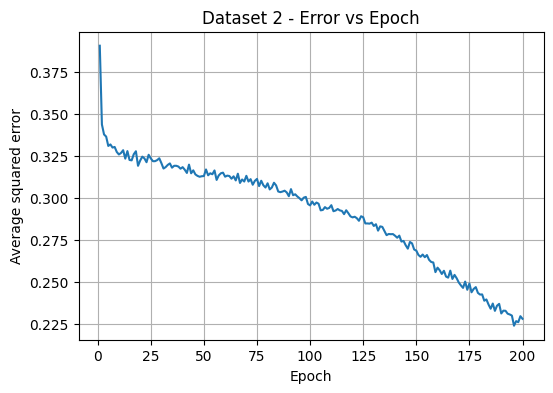

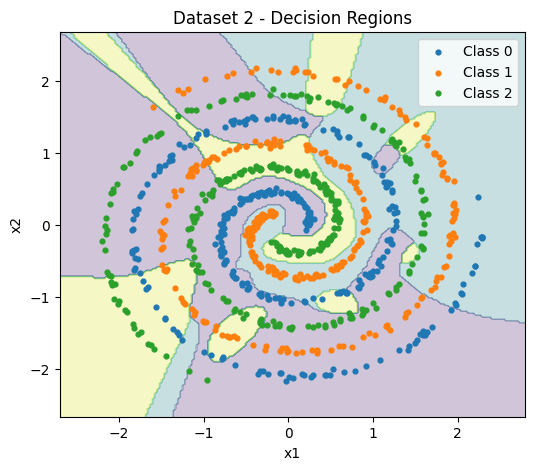

In [13]:
# =====================================================
# DATASET 2
# =====================================================

trX2, trY2, vaX2, vaY2, teX2, teY2 = split_data(X2, y2)

trX2, vaX2, teX2 = standardize(
    trX2,
    vaX2,
    teX2
)

print("Training samples:", len(trX2))
print("Validation samples:", len(vaX2))
print("Test samples:", len(teX2))


# =====================================================
# CROSS VALIDATION
# =====================================================

scores2 = {}

for arch in ARCH2:

    print("\nArchitecture:", arch)

    score = cross_validation(
        trX2,
        trY2,
        arch
    )

    scores2[arch] = score

    print(
        "Average CV accuracy:",
        round(score*100,2),
        "%"
    )


best_arch2 = max(
    scores2,
    key=scores2.get
)

print("\nBest Dataset 2 architecture:", best_arch2)


# =====================================================
# FINAL TRAINING
# =====================================================

model2 = FCNN(best_arch2)

error2 = model2.train(
    trX2,
    trY2
)


# =====================================================
# ACCURACY
# =====================================================

print("\nTraining accuracy:",
      round(model2.accuracy(trX2,trY2)*100,2), "%")

print("Validation accuracy:",
      round(model2.accuracy(vaX2,vaY2)*100,2), "%")

print("Test accuracy:",
      round(model2.accuracy(teX2,teY2)*100,2), "%")


# =====================================================
# CONFUSION MATRICES
# =====================================================

pred_val2 = model2.predict(vaX2)
pred_test2 = model2.predict(teX2)

print("\nValidation Confusion Matrix:")
print(confusion_matrix(vaY2,pred_val2))

print("\nTest Confusion Matrix:")
print(confusion_matrix(teY2,pred_test2))


# =====================================================
# ERROR PLOT
# =====================================================

plot_error(
    error2,
    "Dataset 2 - Error vs Epoch"
)


# =====================================================
# DECISION REGION
# =====================================================

decision_region(
    model2,
    trX2,
    trY2,
    "Dataset 2 - Decision Regions"
)

DATASET 2 - TRAINING NODE OUTPUTS


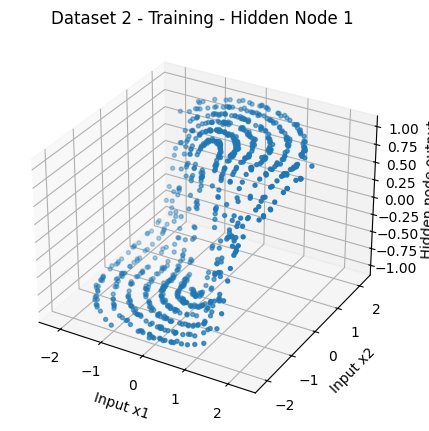

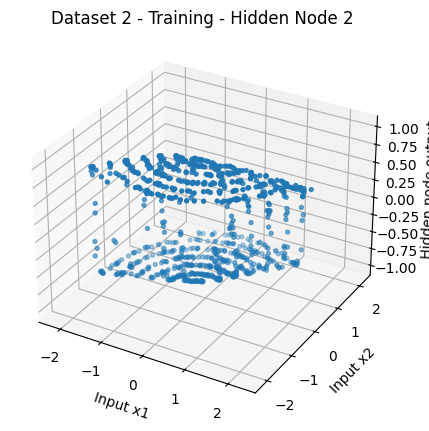

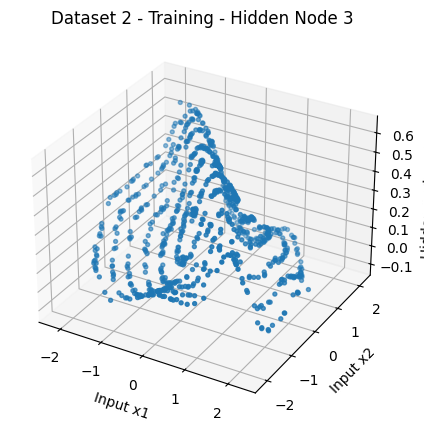

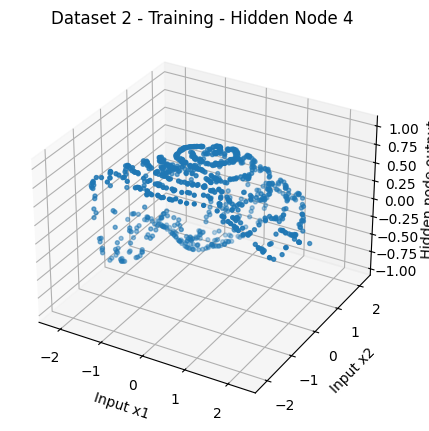

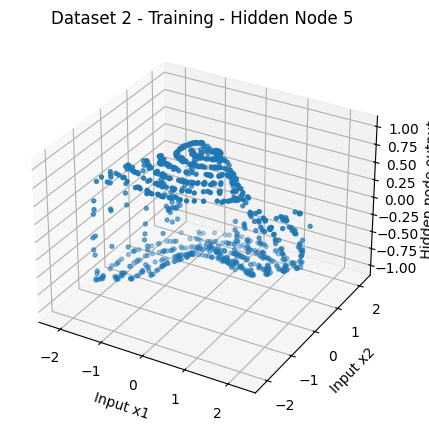

...

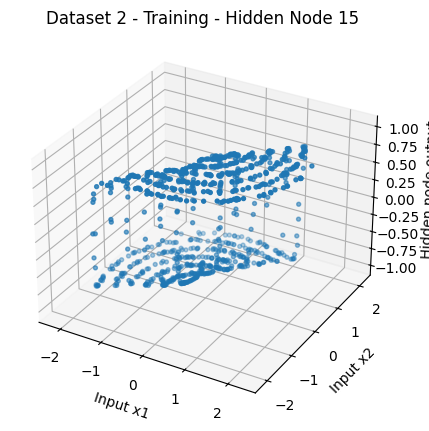

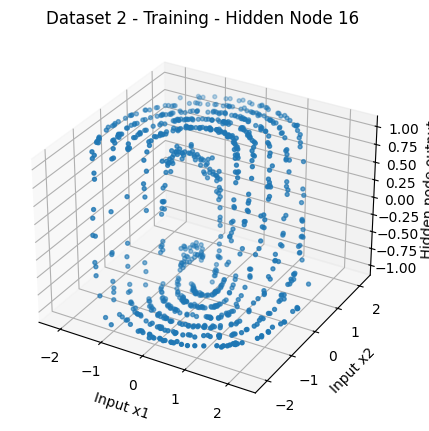

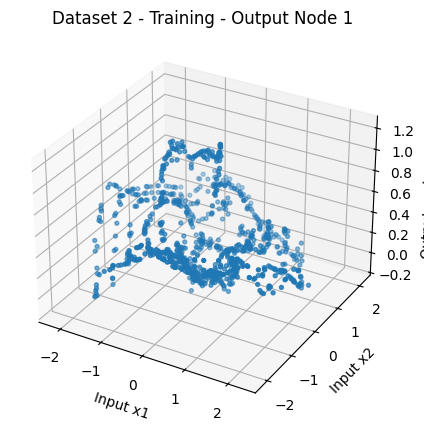

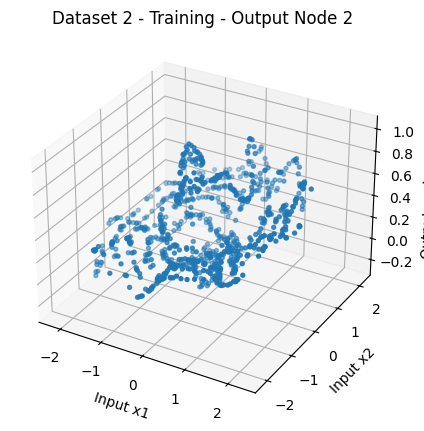

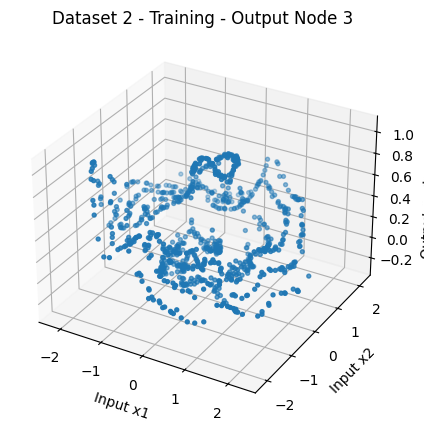

DATASET 2 - VALIDATION NODE OUTPUTS


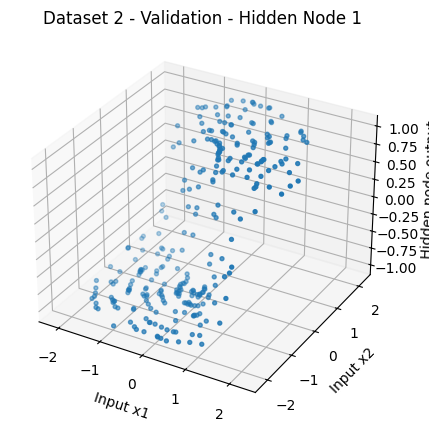

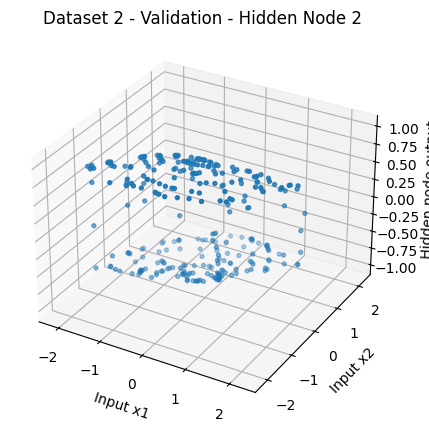

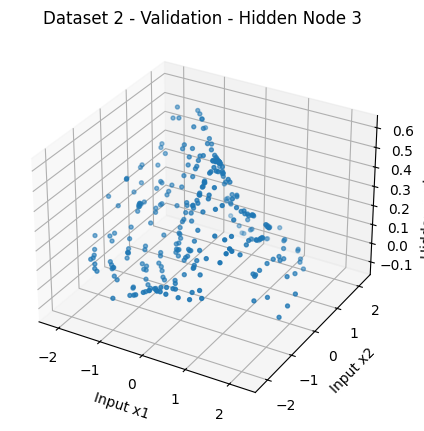

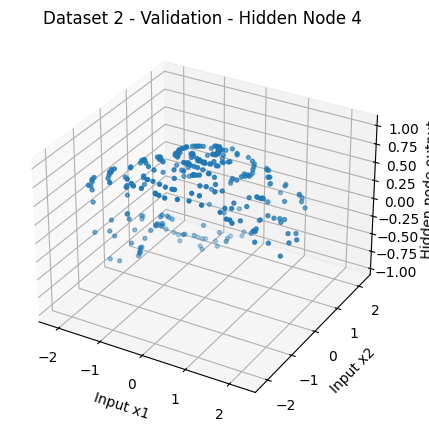

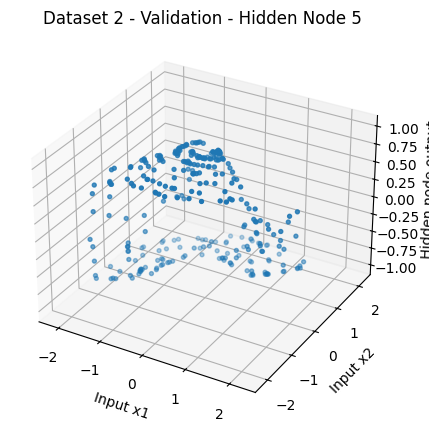

...

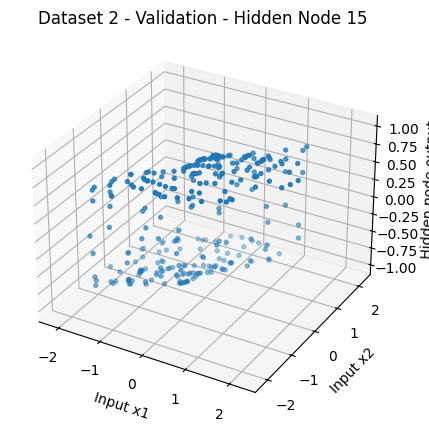

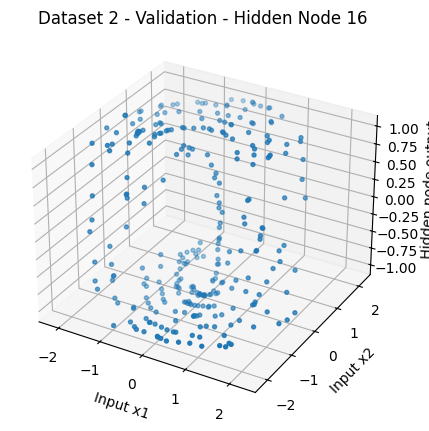

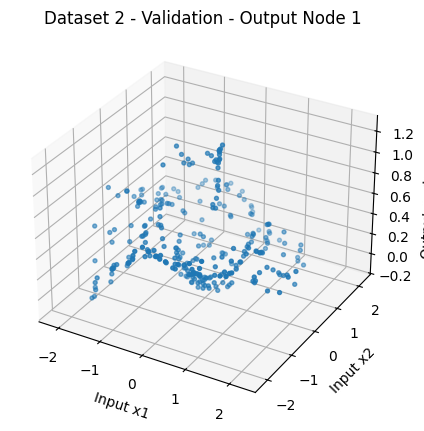

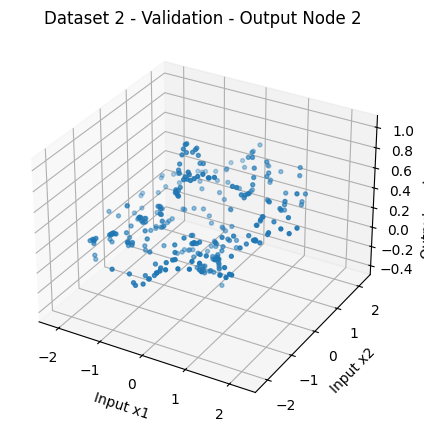

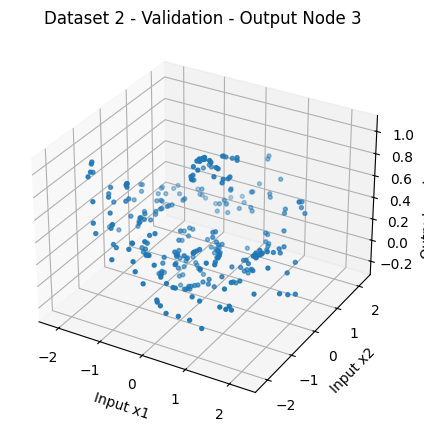

DATASET 2 - TEST NODE OUTPUTS


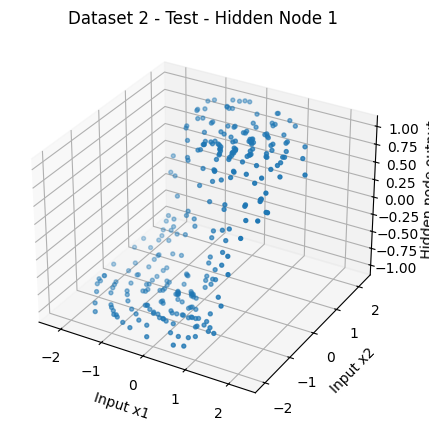

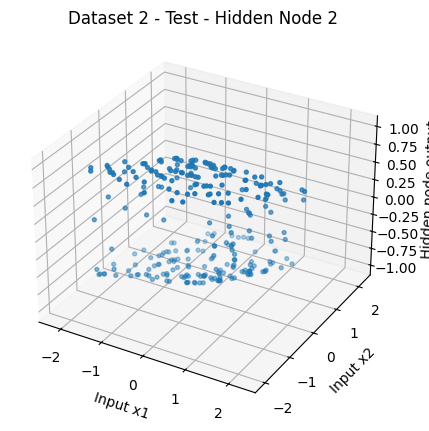

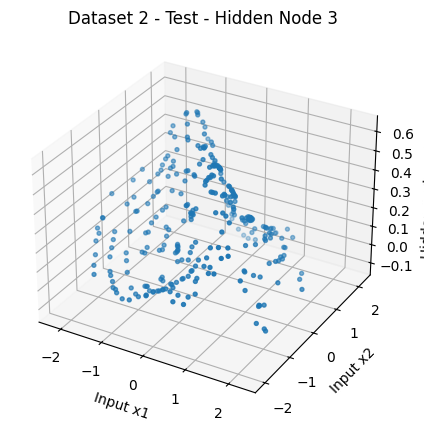

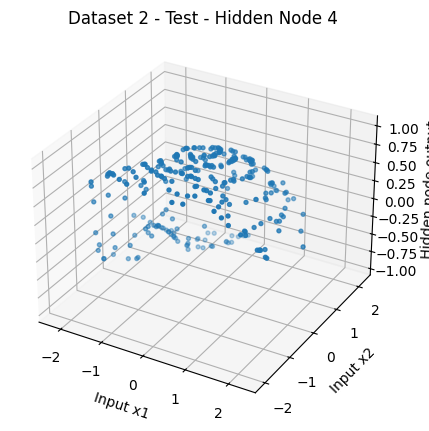

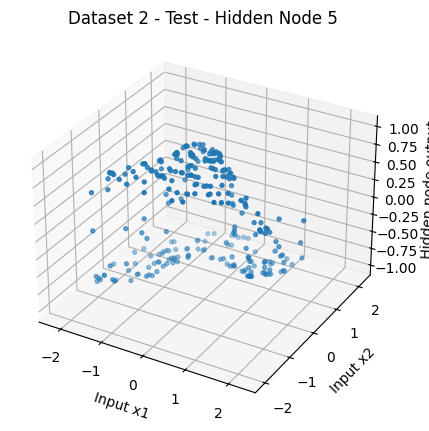

...

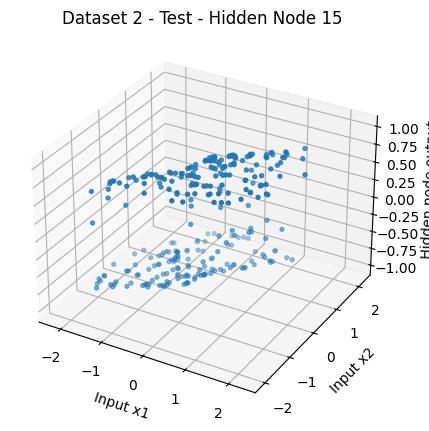

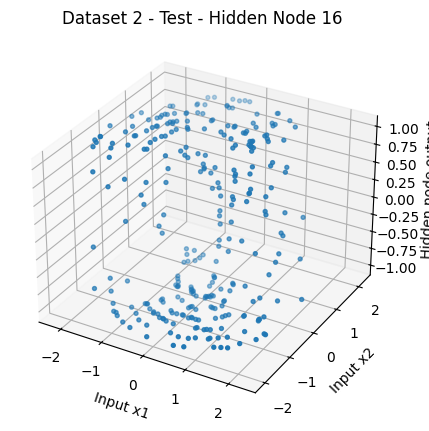

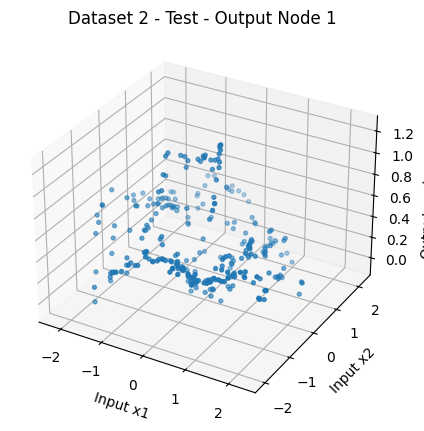

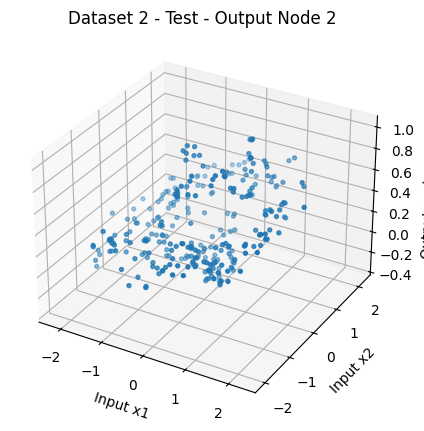

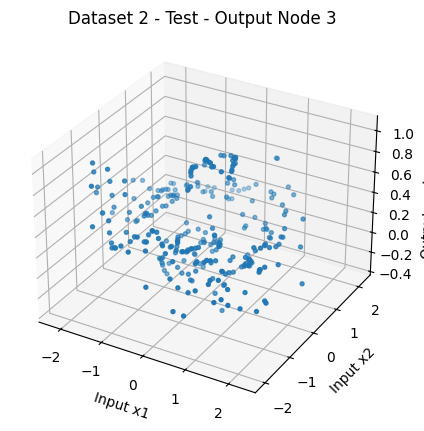

In [14]:
print("DATASET 2 - TRAINING NODE OUTPUTS")

plot_node_outputs(
    model2,
    trX2,
    "Dataset 2 - Training"
)


print("DATASET 2 - VALIDATION NODE OUTPUTS")

plot_node_outputs(
    model2,
    vaX2,
    "Dataset 2 - Validation"
)


print("DATASET 2 - TEST NODE OUTPUTS")

plot_node_outputs(
    model2,
    teX2,
    "Dataset 2 - Test"
)

In [15]:
class LinearModel:

    def __init__(self):

        self.W = np.random.randn(2,3) * 0.1
        self.b = np.zeros(3)


    def train(self,X,y):

        Y = one_hot(y)

        for epoch in range(EPOCHS):

            for i in np.random.permutation(len(X)):

                output = X[i] @ self.W + self.b

                delta = output - Y[i]

                self.W -= LR * np.outer(X[i],delta)
                self.b -= LR * delta


    def predict(self,X):

        output = X @ self.W + self.b

        return np.argmax(output,axis=1)


    def accuracy(self,X,y):

        return np.mean(
            self.predict(X) == y
        )

In [18]:
linear1 = LinearModel()

linear1.train(
    trX1,
    trY1
)

print("DATASET 1 COMPARISON")

print(
    "\nFCNN validation:",
    round(model1.accuracy(vaX1,vaY1)*100,2),
    "%"
)

print(
    "Linear validation:",
    round(linear1.accuracy(vaX1,vaY1)*100,2),
    "%"
)

print(
    "\nFCNN test:",
    round(model1.accuracy(teX1,teY1)*100,2),
    "%"
)

print(
    "Linear test:",
    round(linear1.accuracy(teX1,teY1)*100,2),
    "%"
)

DATASET 1 COMPARISON

FCNN validation: 100.0 %
Linear validation: 100.0 %

FCNN test: 100.0 %
Linear test: 100.0 %


In [17]:
linear2 = LinearModel()

linear2.train(
    trX2,
    trY2
)

print("DATASET 2 COMPARISON")

print(
    "\nFCNN validation:",
    round(model2.accuracy(vaX2,vaY2)*100,2),
    "%"
)

print(
    "Linear validation:",
    round(linear2.accuracy(vaX2,vaY2)*100,2),
    "%"
)

print(
    "\nFCNN test:",
    round(model2.accuracy(teX2,teY2)*100,2),
    "%"
)

print(
    "Linear test:",
    round(linear2.accuracy(teX2,teY2)*100,2),
    "%"
)

DATASET 2 COMPARISON

FCNN validation: 59.33 %
Linear validation: 36.33 %

FCNN test: 60.0 %
Linear test: 37.33 %
